In [42]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import numpy as np
# import matplotlib.axes as ax
def log_loader(logpath,max_size=123):
    with open(logpath) as f:
        rawtxt = f.read().replace("\x1b[94m","").replace("\x1b[91m","").replace("\x1b[0m","").replace("\x1b[92m","").split("\n")
    df = pd.DataFrame(columns=['Epoch','val_acc','test_acc'])
    df_loss = pd.DataFrame(columns=['curr_loss','sec_per_sent'])
    j=0
    for i in range(len(rawtxt)):
        if "Epoch" in rawtxt[i]:
            epoch =  int(rawtxt[i][-2:])
            val_test_list = rawtxt[i+2].split(" ")
            valac = float(val_test_list[5])
            testac = float(val_test_list[10])
            df = df.append({
                'Epoch':epoch,
                'val_acc':valac,
                'test_acc':testac
            }, ignore_index=True)
        if "curr_loss" in rawtxt[i]:
            loss_list = rawtxt[i].split(" ")
            curr_loss = float(loss_list[7][:-1])
            sec_per_sent = float(loss_list[-1])
            df_loss = df_loss.append({
                'curr_loss':curr_loss,
                'sec_per_sent':sec_per_sent
            }, ignore_index=True)
            if j==max_size:
                break
            else:
                j+=1
                
    return df, df_loss

In [43]:
sample_size = 128000

In [44]:
def datapoints(df_loss,smooth=True,ave_num=20,ave=False):
    time = np.cumsum(np.array(df_loss['sec_per_sent']*sample_size))
    loss = np.array(df_loss['curr_loss'])
    i = 0
    if ave:
        ave_losses = []
        while i<len(time):
            ave_loss = np.sum(loss[i:i+4])/4
            i+=4
            ave_losses.append(ave_loss)
        epoch = range(len(ave_losses))
        
        return epoch, ave_losses
            
    if smooth:
        for _ in range(ave_num):     
            loss = (loss[:-1]+loss[1:])/2
        return time[ave_num:], loss
    else:
        return time, loss

In [45]:
def epoch_vs_acc(df_acc,smooth=False,ave_num=2,ave=False):
    epoch = range(31)
    acc = np.array(df_acc.loc[:30])[:,1]
#     i = 0
#     if ave:
#         ave_acc = []
#         while i<len(epoch):
#             ave_acc = np.sum(acc[i:i+4])/4
#             i+=4
#             ave_acc.append(ave_acc)
#         epoch = range(len(ave_losses))
        
#         return epoch, ave_acc
            
#     if smooth:
#         for _ in range(ave_num):     
#             acc = (acc[:-1]+acc[1:])/2
#         return epoch[ave_num:], acc
#     else:
    return epoch, acc

In [46]:
def time_vs_acc(df_acc,df_loss):
    time = np.cumsum(np.array(df_loss['sec_per_sent']*sample_size))
    acc = np.array(df_acc.loc[:30])[:,1]
    time_epoch =[0]
    i = 0
    
    while i<len(time):
        time_epoch.append(time[i])
        i+=4
        
    return time_epoch[:-1], acc
    

## calculation

In [6]:
twod_eucl_rnn, twod_eucl_rnn_loss = log_loader('2D_eucl_rnn.txt')

In [7]:
len(np.array(twod_eucl_rnn_loss['curr_loss']))

124

In [8]:
time_two = np.cumsum(twod_eucl_rnn_loss['sec_per_sent']*sample_size)
time_two

0        64.0
1       128.0
2       192.0
3       256.0
4       320.0
        ...  
119    6745.6
120    6809.6
121    6873.6
122    6937.6
123    7001.6
Name: sec_per_sent, Length: 124, dtype: float64

In [9]:
time_vs_acc(twod_eucl_rnn,twod_eucl_rnn_loss)

([0,
  64.0,
  320.0,
  576.0,
  832.0,
  1088.0,
  1344.0,
  1600.0,
  1843.2,
  2086.4,
  2329.6,
  2547.1999999999994,
  2751.9999999999986,
  2982.3999999999983,
  3187.1999999999975,
  3404.799999999997,
  3609.5999999999963,
  3814.3999999999955,
  4019.199999999995,
  4223.9999999999945,
  4428.799999999994,
  4633.599999999993,
  4838.399999999992,
  5043.199999999992,
  5247.999999999991,
  5452.79999999999,
  5708.79999999999,
  5913.599999999989,
  6118.399999999989,
  6323.199999999988,
  6553.599999999988],
 array([0.6215, 0.7749, 0.7797, 0.7799, 0.7737, 0.7772, 0.7783, 0.7781,
        0.7783, 0.7764, 0.7759, 0.7781, 0.7794, 0.7766, 0.7712, 0.776 ,
        0.7703, 0.7747, 0.777 , 0.777 , 0.7732, 0.7754, 0.7733, 0.7721,
        0.7755, 0.7762, 0.7744, 0.7757, 0.775 , 0.7763, 0.7742]))

In [10]:
twod_hyp_rnn, twod_hyp_rnn_loss = log_loader('2D_hyp_rnn.txt')

In [11]:
time_two= np.cumsum(twod_hyp_rnn_loss['sec_per_sent']*sample_size)
time_two

0        307.2
1        614.4
2        921.6
3       1241.6
4       1548.8
        ...   
119    40576.0
120    41036.8
121    41510.4
122    41971.2
123    42432.0
Name: sec_per_sent, Length: 124, dtype: float64

In [12]:
40*30

1200

In [13]:
29286./60/60

8.135

In [14]:
five_eucl_rnn, five_eucl_rnn_loss = log_loader('5D_eucl_rnn.txt')

In [15]:
time_fived = np.cumsum(five_eucl_rnn_loss['sec_per_sent']*sample_size)
time_fived

0        51.2
1       102.4
2       153.6
3       204.8
4       256.0
        ...  
119    6144.0
120    6195.2
121    6246.4
122    6297.6
123    6348.8
Name: sec_per_sent, Length: 124, dtype: float64

In [16]:
five_hyp_rnn, five_hyp_rnn_loss = log_loader('5D_hyp_rnn.txt')

In [17]:
time_fived = np.cumsum(five_hyp_rnn_loss['sec_per_sent']*sample_size)
time_fived

0        358.4
1        729.6
2       1100.8
3       1484.8
4       1856.0
        ...   
119    42329.6
120    42662.4
121    42995.2
122    43340.8
123    43673.6
Name: sec_per_sent, Length: 124, dtype: float64

In [18]:
ten_eucl_rnn, ten_eucl_rnn_loss = log_loader('10D_eucl_rnn.txt')

In [19]:
time_ten = np.cumsum(ten_eucl_rnn_loss['sec_per_sent']*sample_size)
time_ten

0        76.8
1       153.6
2       230.4
3       307.2
4       384.0
        ...  
119    9216.0
120    9292.8
121    9369.6
122    9446.4
123    9523.2
Name: sec_per_sent, Length: 124, dtype: float64

In [20]:
ten_hyp_rnn, ten_hyp_rnn_loss = log_loader('10D_hyp_rnn.txt')

In [21]:
time_ten = np.cumsum(ten_hyp_rnn_loss['sec_per_sent']*sample_size)
time_ten

0        307.2
1        614.4
2        921.6
3       1228.8
4       1536.0
        ...   
119    37324.8
120    37644.8
121    37952.0
122    38259.2
123    38566.4
Name: sec_per_sent, Length: 124, dtype: float64

In [22]:
38566.4/60/60

10.71288888888889

In [23]:
hundred_hyp_pretrained, hundred_hyp_pretrained_loss = log_loader('100D_hyp_glove.txt')
time_hundred = np.cumsum(hundred_hyp_pretrained_loss['sec_per_sent']*sample_size)
time_hundred

0        563.2
1       1126.4
2       1676.8
3       2240.0
4       2803.2
        ...   
114    59635.2
115    60108.8
116    60595.2
117    61068.8
118    61542.4
Name: sec_per_sent, Length: 119, dtype: float64

In [24]:
61542/60/60

17.095000000000002

In [25]:
hundred_hyp_pretrained.loc[30]

Epoch       16.0000
val_acc      0.7747
test_acc     0.7707
Name: 30, dtype: float64

In [26]:
hundred_hyp_rnn = pd.read_csv('100D_hyp_rnn.txt', sep=",")
epoch = np.array(hundred_hyp_rnn)[:,0]
acc = np.array(hundred_hyp_rnn)[:,1]

In [27]:
hundred_hyp_rnn.loc[30]

Epoch       30.0000
val_acc      0.8505
test_acc     0.8429
Name: 30, dtype: float64

## Result (Accuracies)

In [28]:
twod_eucl_rnn.loc[30]

Epoch       30.0000
val_acc      0.7742
test_acc     0.7791
Name: 30, dtype: float64

In [29]:
twod_hyp_rnn.loc[30]

Epoch       4.0000
val_acc     0.7914
test_acc    0.7919
Name: 30, dtype: float64

In [30]:
five_eucl_rnn.loc[30]

Epoch       30.0000
val_acc      0.7891
test_acc     0.7852
Name: 30, dtype: float64

In [31]:
five_hyp_rnn.loc[30]

Epoch       7.0000
val_acc     0.8141
test_acc    0.8139
Name: 30, dtype: float64

In [32]:
ten_eucl_rnn.loc[30]

Epoch       30.0000
val_acc      0.7970
test_acc     0.7877
Name: 30, dtype: float64

In [33]:
ten_hyp_rnn.loc[30]

Epoch       4.0000
val_acc     0.8254
test_acc    0.8227
Name: 30, dtype: float64

In [34]:
hundred_hyp_rnn.loc[30]

Epoch       30.0000
val_acc      0.8505
test_acc     0.8429
Name: 30, dtype: float64

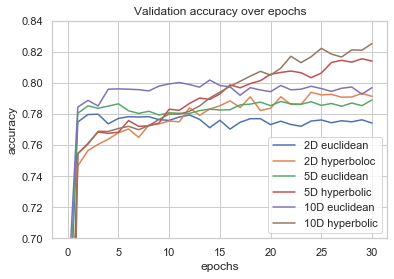

In [51]:
sns.set_style("whitegrid")
fig, ax = plt.subplots()
epoch,acc = epoch_vs_acc(twod_eucl_rnn)
plt.plot(epoch, acc,label='2D euclidean')
    
epoch,acc = epoch_vs_acc(twod_hyp_rnn)
plt.plot(epoch, acc,label='2D hyperboloc')

epoch,acc = epoch_vs_acc(five_eucl_rnn)
plt.plot(epoch, acc,label='5D euclidean')

epoch,acc = epoch_vs_acc(five_hyp_rnn)
plt.plot(epoch, acc,label='5D hyperbolic')

epoch, acc = epoch_vs_acc(ten_eucl_rnn)
plt.plot(epoch, acc,label='10D euclidean')

epoch,acc = epoch_vs_acc(ten_hyp_rnn)
plt.plot(epoch, acc,label='10D hyperbolic')

plt.legend()
plt.ylabel('accuracy')
plt.xlabel('epochs')
plt.title('Validation accuracy over epochs')
plt.ylim(0.7,0.84)
plt.savefig('epoch_acc.png')

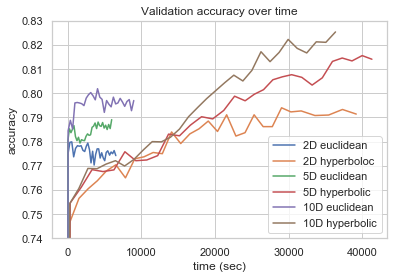

In [43]:
sns.set_style("whitegrid")
fig, ax = plt.subplots()

time,acc = time_vs_acc(twod_eucl_rnn, twod_eucl_rnn_loss)
plt.plot(time, acc,label='2D euclidean')
    
time,acc = time_vs_acc(twod_hyp_rnn,twod_hyp_rnn_loss)
plt.plot(time, acc,label='2D hyperboloc')

time,acc = time_vs_acc(five_eucl_rnn,five_eucl_rnn_loss)
plt.plot(time, acc,label='5D euclidean')

time,acc = time_vs_acc(five_hyp_rnn,five_hyp_rnn_loss)
plt.plot(time, acc,label='5D hyperbolic')

time, acc = time_vs_acc(ten_eucl_rnn,ten_eucl_rnn_loss)
plt.plot(time, acc,label='10D euclidean')

time,acc = time_vs_acc(ten_hyp_rnn,ten_hyp_rnn_loss)
plt.plot(time, acc,label='10D hyperbolic')

plt.legend()
plt.ylabel('accuracy')
plt.xlabel('time (sec)')
plt.title('Validation accuracy over time')
plt.ylim(0.74,0.83)
plt.savefig('time_acc.png')

In [35]:
time_acc_df = pd.DataFrame([])
dim_list = ['2D_euclidean','2D_hyperbolic','5D_euclidean','5D_hyperbolic','10D_euclidean','10D_hyperbolic']
time_df_list = [twod_eucl_rnn_loss,twod_hyp_rnn_loss,five_eucl_rnn_loss,five_hyp_rnn_loss,ten_eucl_rnn_loss,ten_hyp_rnn_loss]

for name, time_df in zip(dim_list, time_df_list):
    time =  np.array(np.cumsum(time_df['sec_per_sent']*sample_size))[-1] 
    dim,types = name.split('_')
    time_acc_df = time_acc_df.append({
        'time(sec)':time,
        'dim':dim,
        'models':types
            }, ignore_index=True)
    

In [36]:
time_acc_df

,dim,models,time(sec)
0,2D,euclidean,7001.6
1,2D,hyperbolic,42432.0
2,5D,euclidean,6348.8
3,5D,hyperbolic,43673.6
4,10D,euclidean,9523.2
5,10D,hyperbolic,38566.4


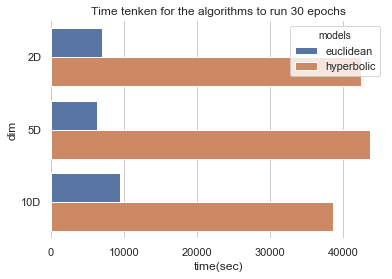

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(font_scale=1)
# Initialize the matplotlib figure
# f, ax = plt.subplots(figsize=(15, 5))
sns.set_style("whitegrid")
# # Load the example car crash dataset
# crashes = sns.load_dataset("car_crashes").sort_values("total", ascending=False)
# print(crashes)
# Plot the total crashes
plt.title("Time tenken for the algorithms to run 30 epochs")
# sns.set_color_codes("muted")
sns.color_palette("hls", 8)
sns.barplot(x="time(sec)", y="dim", data=time_acc_df,hue='models')

# sns.set_color_codes("muted")
# sns.barplot(x="eucl_time", y="dim", data=time_acc_df,
#             label="euclidean", color="b")

# Add a legend and informative axis label
# ax.legend(ncol=2, loc="lower right", frameon=True)
# ax.set(ylabel="",
#        xlabel="time (sec)")
sns.despine(left=True, bottom=True)
plt.savefig('time_acc_table.png')

In [39]:
time_acc_df = pd.DataFrame([])
dim_list = ['5D_hyperbolic','100D_euclidean']
time_df_list = [five_hyp_rnn_loss,twod_hyp_rnn_loss]

for name, time_df in zip(dim_list, time_df_list):
    if name=='100D_euclidean':
        time_acc_df = time_acc_df.append({
            'time(min)':np.round(9060/60),
            'dim':'100D',
            'models':"eucl"
                }, ignore_index=True)
    else:
        time =  np.array(np.cumsum(time_df['sec_per_sent']*sample_size))[-1] 
        dim,types = name.split('_')
        time_acc_df = time_acc_df.append({
            'time(min)':np.round(time/60),
            'dim':dim,
            'models':types
                }, ignore_index=True)

In [40]:
time_acc_df

,dim,models,time(min)
0,5D,hyperbolic,728.0
1,100D,eucl,151.0


In [37]:
sns.set_style("whitegrid")

NameError: name 'sns' is not defined

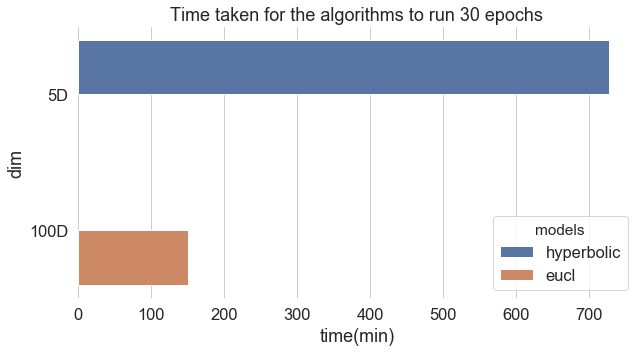

In [41]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(10, 5))
# # Load the example car crash dataset
# crashes = sns.load_dataset("car_crashes").sort_values("total", ascending=False)
# print(crashes)
# Plot the total crashes
plt.title("Time taken for the algorithms to run 30 epochs")
# sns.set_color_codes("muted")
sns.color_palette("hls", 8)
sns.barplot(x="time(min)", y="dim", data=time_acc_df,hue='models')

# sns.set_color_codes("muted")
# sns.barplot(x="eucl_time", y="dim", data=time_acc_df,
#             label="euclidean", color="b")

# Add a legend and informative axis label
# ax.legend(ncol=2, loc="lower right", frameon=True)
# ax.set(ylabel="",
#        xlabel="time (sec)")
sns.despine(left=True, bottom=True)
plt.savefig('time_acc_table.png')

In [153]:
sns.set_style("whitegrid")

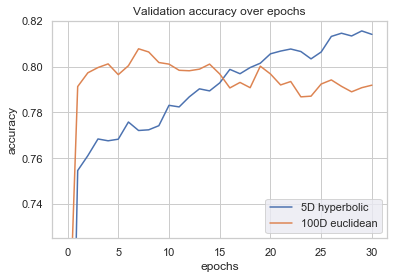

In [154]:
fig, ax = plt.subplots()
sns.set(font_scale=1)
    
# epoch,acc = epoch_vs_acc(twod_hyp_rnn)
# plt.plot(epoch, acc,label='2D hyperboloc')

epoch,acc = epoch_vs_acc(five_hyp_rnn)
plt.plot(epoch, acc,label='5D hyperbolic')

hundred_eucl_rnn = pd.read_csv('100D_eucl_rnn.txt', sep=",")
epoch = np.array(hundred_eucl_rnn)[:,0]
acc = np.array(hundred_eucl_rnn)[:,1]

plt.plot(epoch, acc,label='100D euclidean')

plt.legend()
plt.ylabel('accuracy')
plt.xlabel('epochs')
plt.title('Validation accuracy over epochs')
plt.ylim(0.725,0.82)
plt.savefig('epoch_acc_with100D.png')

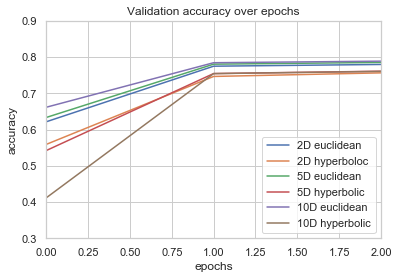

In [44]:
sns.set_style("whitegrid")
fig, ax = plt.subplots()

epoch,acc = epoch_vs_acc(twod_eucl_rnn)
plt.plot(epoch, acc,label='2D euclidean')
    
epoch,acc = epoch_vs_acc(twod_hyp_rnn)
plt.plot(epoch, acc,label='2D hyperboloc')

epoch,acc = epoch_vs_acc(five_eucl_rnn)
plt.plot(epoch, acc,label='5D euclidean')

epoch,acc = epoch_vs_acc(five_hyp_rnn)
plt.plot(epoch, acc,label='5D hyperbolic')

epoch, acc = epoch_vs_acc(ten_eucl_rnn)
plt.plot(epoch, acc,label='10D euclidean')

epoch,acc = epoch_vs_acc(ten_hyp_rnn)
plt.plot(epoch, acc,label='10D hyperbolic')

plt.legend()
plt.ylabel('accuracy')
plt.xlabel('epochs')
plt.title('Validation accuracy over epochs')
plt.ylim(0.3,0.9)
plt.xlim(0,2)
plt.savefig('epoch_acc_zoom.png')

In [ ]:
fig, ax = plt.subplots()

epoch,acc = epoch_vs_acc(twod_eucl_rnn)
plt.plot(epoch, acc,label='2D euclidean')
    
epoch,acc = epoch_vs_acc(twod_hyp_rnn)
plt.plot(epoch, acc,label='2D hyperboloc')

epoch,acc = epoch_vs_acc(five_eucl_rnn)
plt.plot(epoch, acc,label='5D euclidean')

epoch,acc = epoch_vs_acc(five_hyp_rnn)
plt.plot(epoch, acc,label='5D hyperbolic')

epoch, acc = epoch_vs_acc(ten_eucl_rnn)
plt.plot(epoch, acc,label='10D euclidean')

epoch,acc = epoch_vs_acc(ten_hyp_rnn)
plt.plot(epoch, acc,label='10D hyperbolic')

epoch,acc = epoch_vs_acc(hundred_hyp_rnn)
plt.plot(epoch, acc,label='100D hyperbolic')

epoch,acc = epoch_vs_acc(hundred_hyp_pretrained)
plt.plot(epoch, acc,label='100D hyperbolic pretrained')

plt.legend()
plt.ylabel('accuracy')
plt.xlabel('epochs')
plt.title('Accuracy over epochs')
plt.ylim(0.3,0.8)
plt.xlim(0,2)
plt.savefig('epoch_acc_zoom_with_100D.png')

In [ ]:
epoch,acc = epoch_vs_acc(hundred_hyp_rnn)
plt.plot(epoch, acc,label='100D hyperbolic')
epoch,acc = epoch_vs_acc(hundred_hyp_pretrained)
plt.plot(epoch, acc,label='100D hyperbolic pretrained')
plt.legend()
plt.ylabel('accuracy')
plt.xlabel('epochs')
plt.title('Accuracy over epochs')
# plt.ylim(0.3,0.9)
# plt.xlim(0,2)
plt.savefig('epoch_acc_100D.png')

## Result (Losses)

In [ ]:
time,loss = datapoints(twod_eucl_rnn_loss)
plt.scatter(time, loss)
plt.plot(time, loss,label='2D euclidean')
time,loss = datapoints(twod_hyp_rnn_loss)
plt.scatter(time, loss)
plt.plot(time, loss,label='2D hyperboloc')
time,loss = datapoints(five_eucl_rnn_loss)
plt.scatter(time, loss)
plt.plot(time, loss,label='5D euclidean')
time,loss = datapoints(five_hyp_rnn_loss)
plt.scatter(time, loss)
plt.plot(time, loss,label='5D hyperbolic')
time, loss = datapoints(ten_eucl_rnn_loss)
plt.scatter(time, loss)
plt.plot(time, loss,label='10D euclidean')
time,loss = datapoints(ten_hyp_rnn_loss)
plt.scatter(time, loss)
plt.plot(time, loss,label='10D hyperbolic')
plt.legend()
plt.ylabel('loss')
plt.xlabel('time (seconds)')
plt.title('Averaged loss over time')
plt.savefig('plot1.png')

In [ ]:
time,loss = datapoints(twod_eucl_rnn_loss)
plt.scatter(time, loss)
plt.plot(time, loss,label='2D euclidean')

time,loss = datapoints(five_eucl_rnn_loss)
plt.scatter(time, loss)
plt.plot(time, loss,label='5D euclidean')

time, loss = datapoints(ten_eucl_rnn_loss)
plt.scatter(time, loss)
plt.plot(time, loss,label='10D euclidean')

plt.legend()
plt.ylabel('loss')
plt.xlabel('time (seconds)')
plt.title('Averaged loss over time for Euclidean RNN')
plt.savefig('plot2.png')

In [ ]:

time,loss = datapoints(twod_hyp_rnn_loss)
plt.scatter(time, loss)
plt.plot(time, loss,label='2D hyperboloc')

time,loss = datapoints(five_hyp_rnn_loss)
plt.scatter(time, loss)
plt.plot(time, loss,label='5D hyperbolic')

time,loss = datapoints(ten_hyp_rnn_loss)
plt.scatter(time, loss)
plt.plot(time, loss,label='10D hyperbolic')
plt.legend()
plt.ylabel('loss')
plt.xlabel('time (seconds)')
plt.title('Averaged loss over time for Hyperbolic RNN')
plt.savefig('plot3.png')

In [ ]:
fig, ax = plt.subplots()
time,loss = datapoints(twod_eucl_rnn_loss,ave_num=40)
epoch = np.linspace(0,30,num=len(loss))
# plt.scatter(epoch, loss)
plt.plot(epoch, loss,label='2D euclidean')
time,loss = datapoints(twod_hyp_rnn_loss)
epoch = np.linspace(0,30,num=len(loss))
# # plt.scatter(epoch, loss)
plt.plot(epoch, loss,label='2D hyperboloc')
time,loss = datapoints(five_eucl_rnn_loss,ave_num=40)
epoch = np.linspace(0,30,num=len(loss))
# plt.scatter(epoch, loss)
plt.plot(epoch, loss,label='5D euclidean')
time,loss = datapoints(five_hyp_rnn_loss,ave_num=40)
epoch = np.linspace(0,30,num=len(loss))
# plt.scatter(epoch, loss)
plt.plot(epoch, loss,label='5D hyperbolic')
time, loss = datapoints(ten_eucl_rnn_loss,ave_num=40)
epoch = np.linspace(0,30,num=len(loss))
# plt.scatter(epoch, loss)
plt.plot(epoch, loss,label='10D euclidean')
time,loss = datapoints(ten_hyp_rnn_loss,ave_num=40)
epoch = np.linspace(0,30,num=len(loss))
# plt.scatter(epoch, loss)
plt.plot(epoch, loss,label='10D hyperbolic')
plt.legend()
plt.ylabel('loss')
plt.xlabel('epochs')
plt.title('Averaged loss over time')
ax.set_aspect(100)
plt.savefig('epoch_loss_smoothed.png')

In [ ]:
epoch,loss = datapoints(twod_eucl_rnn_loss,ave=True)
# plt.scatter(epoch, loss)
plt.plot(epoch, loss,label='2D euclidean')
epoch,loss = datapoints(twod_hyp_rnn_loss,ave=True)
# plt.scatter(epoch, loss)
plt.plot(epoch, loss,label='2D hyperboloc')
epoch,loss = datapoints(five_eucl_rnn_loss,ave=True)
# plt.scatter(epoch, loss)
plt.plot(epoch, loss,label='5D euclidean')
epoch,loss = datapoints(five_hyp_rnn_loss,ave=True)
# plt.scatter(epoch, loss)
plt.plot(epoch, loss,label='5D hyperbolic')
epoch, loss = datapoints(ten_eucl_rnn_loss,ave=True)
# plt.scatter(epoch, loss)
plt.plot(epoch, loss,label='10D euclidean')
epoch,loss = datapoints(ten_hyp_rnn_loss,ave=True)
# plt.scatter(epoch, loss)
plt.plot(epoch, loss,label='10D hyperbolic')
plt.legend()
plt.ylabel('loss')
plt.xlabel('epoch')
# plt.title('Averaged loss over time')
plt.savefig('plot5.png')

## Dirty vs not Dirty

In [45]:
five_eucl_rnn_dirty, five_eucl_rnn_loss_dirty = log_loader('5D_eucl_rnn_dirty.txt')

In [46]:
five_hyp_rnn_dirty, five_hyp_rnn_loss_dirty = log_loader('5D_hyp_rnn_dirty.txt')

In [47]:
five_eucl_rnn_dirty.loc[30]

Epoch       30.0000
val_acc      0.7837
test_acc     0.7865
Name: 30, dtype: float64

In [48]:
five_hyp_rnn_dirty.loc[30]

Epoch       7.0000
val_acc     0.8074
test_acc    0.8068
Name: 30, dtype: float64

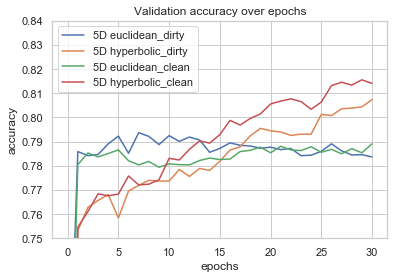

In [52]:
sns.set_style("whitegrid")
fig, ax = plt.subplots()

epoch,acc = epoch_vs_acc(five_eucl_rnn_dirty)
plt.plot(epoch, acc,label='5D euclidean_dirty')

epoch,acc = epoch_vs_acc(five_hyp_rnn_dirty)
plt.plot(epoch, acc,label='5D hyperbolic_dirty')

epoch,acc = epoch_vs_acc(five_eucl_rnn)
plt.plot(epoch, acc,label='5D euclidean_clean')

epoch,acc = epoch_vs_acc(five_hyp_rnn)
plt.plot(epoch, acc,label='5D hyperbolic_clean')

plt.legend()
plt.ylabel('accuracy')
plt.xlabel('epochs')
plt.title('Validation accuracy over epochs')
plt.ylim(0.75,0.84)
plt.savefig('epoch_acc_dirty.png')

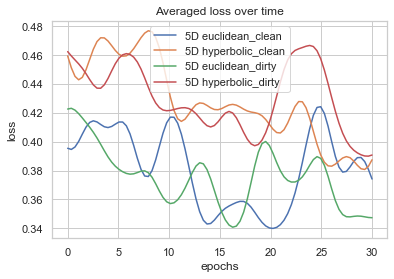

In [50]:
sns.set_style("whitegrid")
fig, ax = plt.subplots()
time,loss = datapoints(twod_eucl_rnn_loss,ave_num=40)
epoch = np.linspace(0,30,num=len(loss))

time,loss = datapoints(five_eucl_rnn_loss,ave_num=40)
epoch = np.linspace(0,30,num=len(loss))
plt.plot(epoch, loss,label='5D euclidean_clean')

time,loss = datapoints(five_hyp_rnn_loss,ave_num=40)
epoch = np.linspace(0,30,num=len(loss))
plt.plot(epoch, loss,label='5D hyperbolic_clean')

time, loss = datapoints(five_eucl_rnn_loss_dirty,ave_num=40)
epoch = np.linspace(0,30,num=len(loss))
plt.plot(epoch, loss,label='5D euclidean_dirty')

time,loss = datapoints(five_hyp_rnn_loss_dirty,ave_num=40)
epoch = np.linspace(0,30,num=len(loss))
plt.plot(epoch, loss,label='5D hyperbolic_dirty')


plt.legend()
plt.ylabel('loss')
plt.xlabel('epochs')
plt.title('Averaged loss over time')
# ax.set_aspect(200)
plt.savefig('epoch_loss_smoothed_dirty.png')

In [47]:
import pandas as pd 
# Read data from file 'filename.csv' 
# (in the same directory that your python process is based)
# Control delimiters, rows, column names with read_csv (see later) 
embed = pd.read_csv("poincare_glove_over_epochs\emb_snli_vocab\dim_2_epoch_50.csv")[:25000]

In [48]:
len(embed)/1500

16.666666666666668

In [49]:
N = len(embed)
add_info = pd.DataFrame([])
sizes = np.flip(np.linspace(0,10,18),0)
split_id = 1
grouped_data = []
for i in range(N):
    if i<=split_id*1500:
        add_info = add_info.append({
                'size':sizes[split_id],
                'importance':split_id*500
            }, ignore_index=True)
    else:
        split_id+=1
        add_info = add_info.append({
                'size':sizes[split_id],
                'importance':split_id*500
            }, ignore_index=True)
        grouped_data.append(embed[:i].join(add_info))
#     elif i<2000:
#         add_info = add_info.append({
#                 'size':1,
#                 'importance':"rare"
#             }, ignore_index=True)
#     else:
#         add_info = add_info.append({
#                 'size':0,
#                 'importance':"super rare"
#             }, ignore_index=True)

In [50]:
add_info

,importance,size
0,500.0,9.411765
1,500.0,9.411765
2,500.0,9.411765
3,500.0,9.411765
4,500.0,9.411765
...,...,...
24995,8500.0,0.000000
24996,8500.0,0.000000
24997,8500.0,0.000000
24998,8500.0,0.000000


In [52]:
embed_data = embed.join(add_info)

In [53]:
embed_data 

,word,dim1,dim2,importance,size
0,the,0.423820,-0.313314,500.0,9.411765
1,of,0.462724,-0.247112,500.0,9.411765
2,and,0.445376,-0.268302,500.0,9.411765
3,in,0.441299,-0.298543,500.0,9.411765
4,to,0.462861,-0.298133,500.0,9.411765
...,...,...,...,...,...
24995,microwaved,-0.075050,0.070615,8500.0,0.000000
24996,neater,-0.092164,0.068388,8500.0,0.000000
24997,nibbling,-0.126728,0.053480,8500.0,0.000000
24998,numbed,-0.116207,0.068459,8500.0,0.000000


In [54]:
grouped_data[0]

,word,dim1,dim2,importance,size
0,the,0.423820,-0.313314,500.0,9.411765
1,of,0.462724,-0.247112,500.0,9.411765
2,and,0.445376,-0.268302,500.0,9.411765
3,in,0.441299,-0.298543,500.0,9.411765
4,to,0.462861,-0.298133,500.0,9.411765
...,...,...,...,...,...
1496,architecture,0.389941,-0.006584,500.0,9.411765
1497,brand,0.339564,-0.115907,500.0,9.411765
1498,scale,0.428659,-0.016429,500.0,9.411765
1499,bring,0.380849,-0.254813,500.0,9.411765


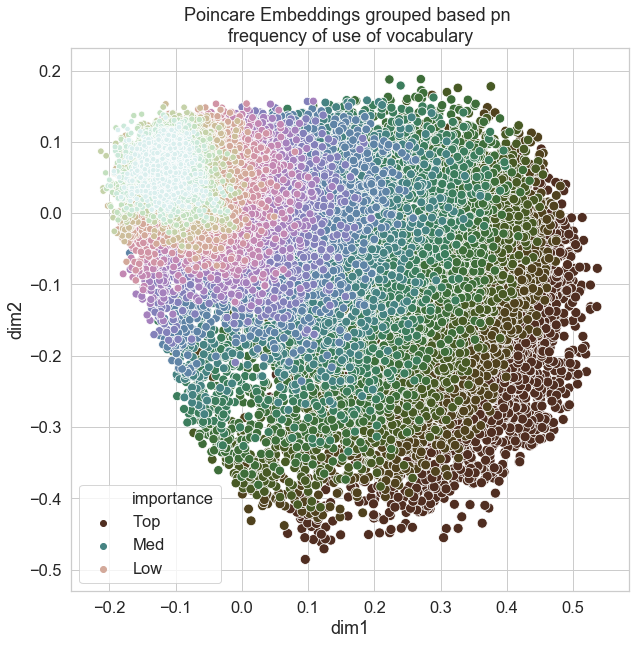

In [55]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
f, ax = plt.subplots(figsize=(10, 10))
plt.title("Poincare Embeddings grouped based pn \nfrequency of use of vocabulary")
cmap = sns.cubehelix_palette(rot=2,gamma=.9,dark=.9, light=.18, as_cmap=True)
# cmap = sns.cubehelix_palette(rot=-.001, as_cmap=True)
ax = sns.scatterplot(x="dim1", y="dim2",hue="importance", size="size",palette=cmap, sizes=(30, 100),data=embed_data)
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[:4], labels=["importance","Top","Med","Low"])
plt.savefig("worddistributionsall")

In [281]:
len(grouped_data)

16

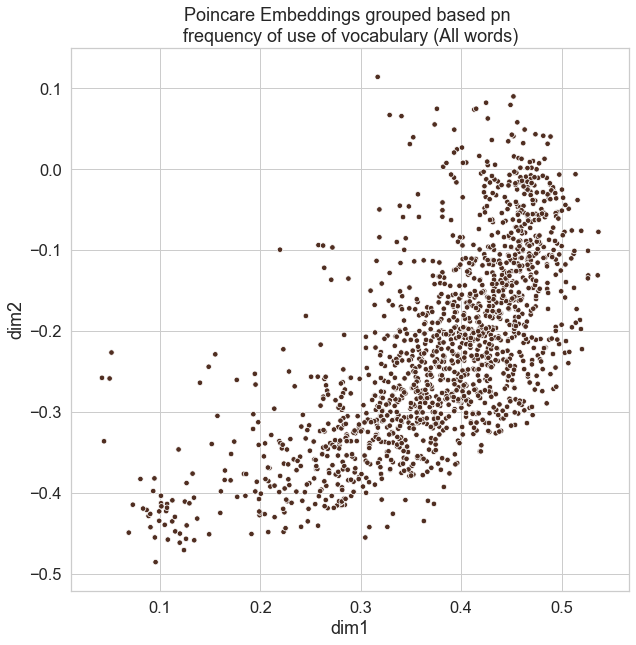

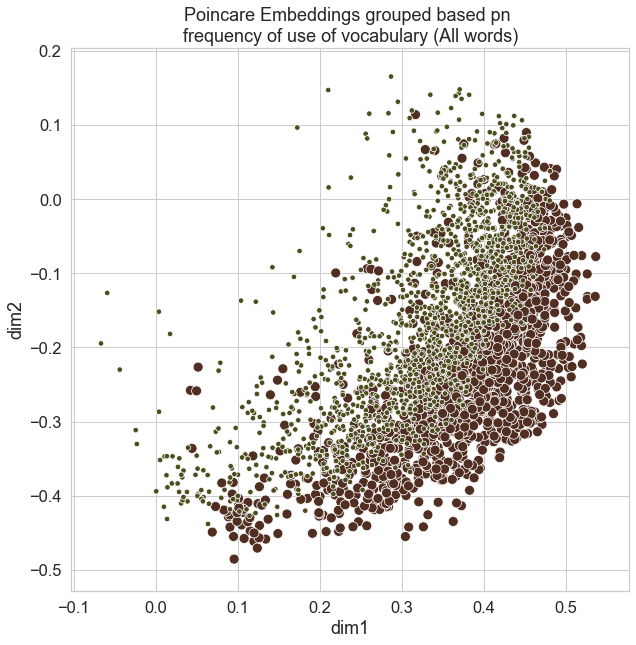

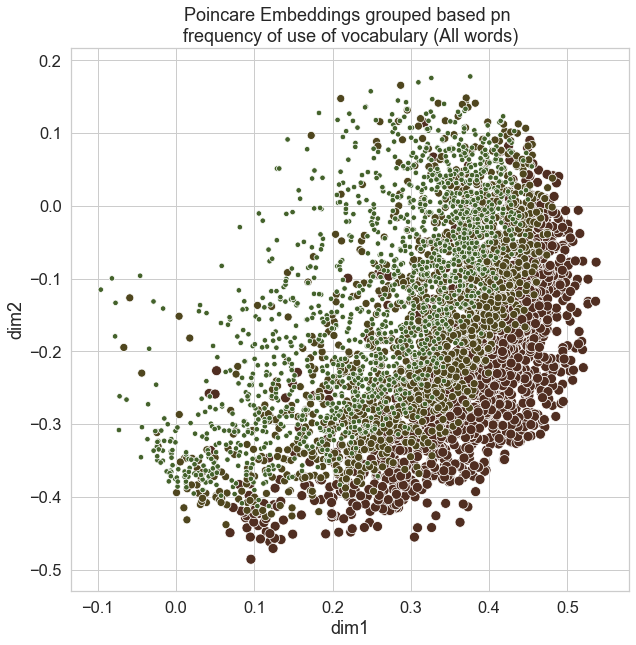

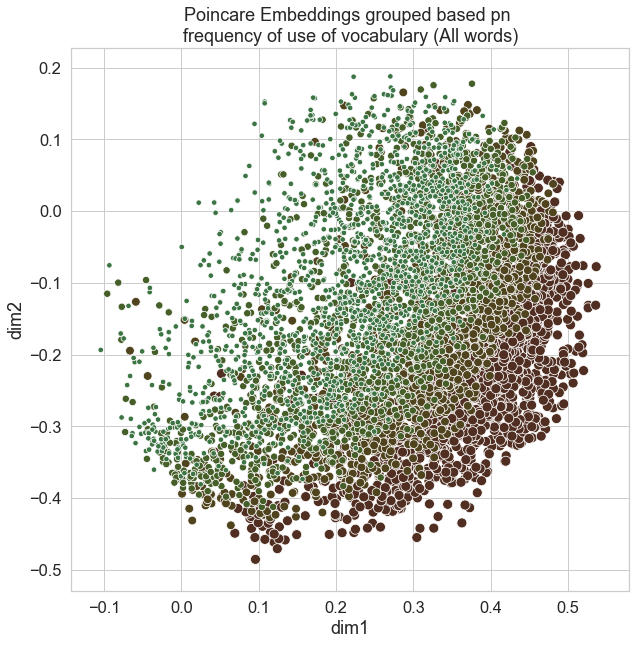

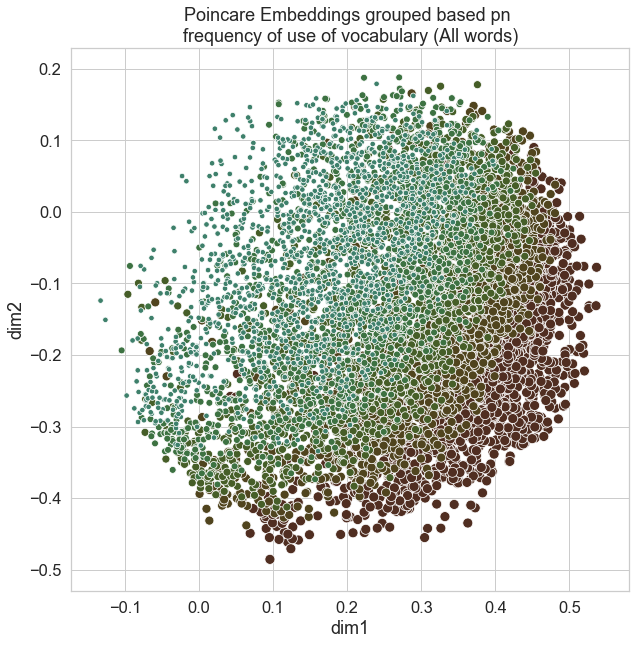

...

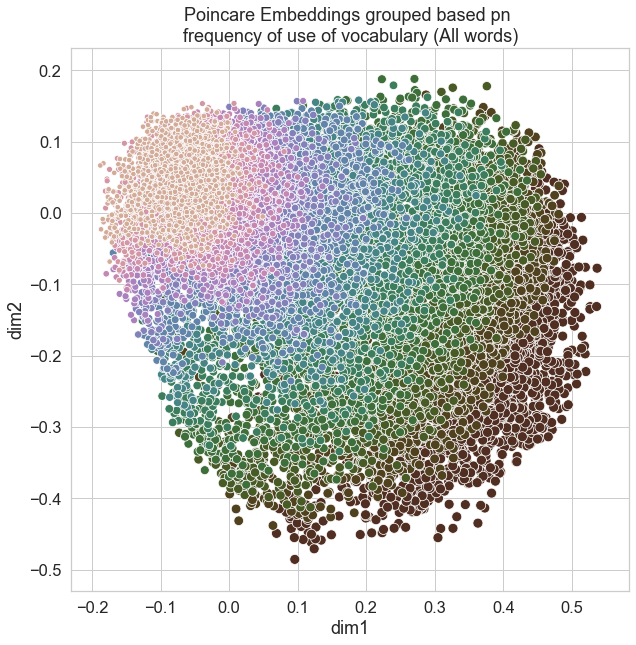

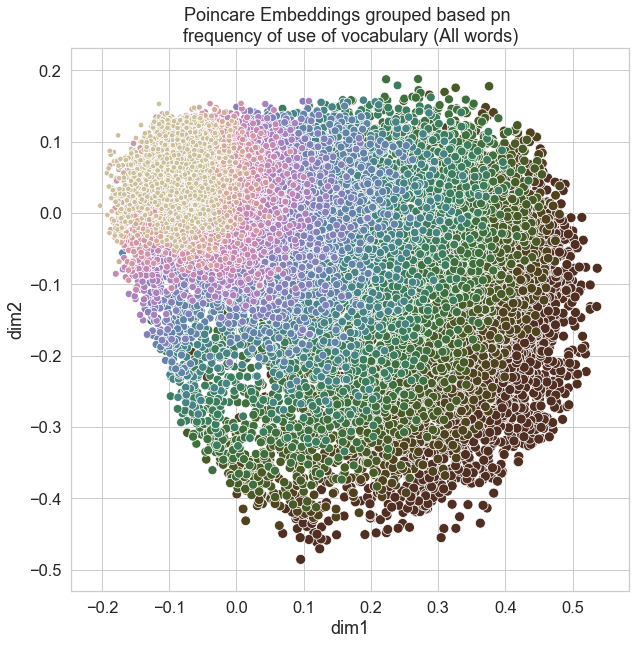

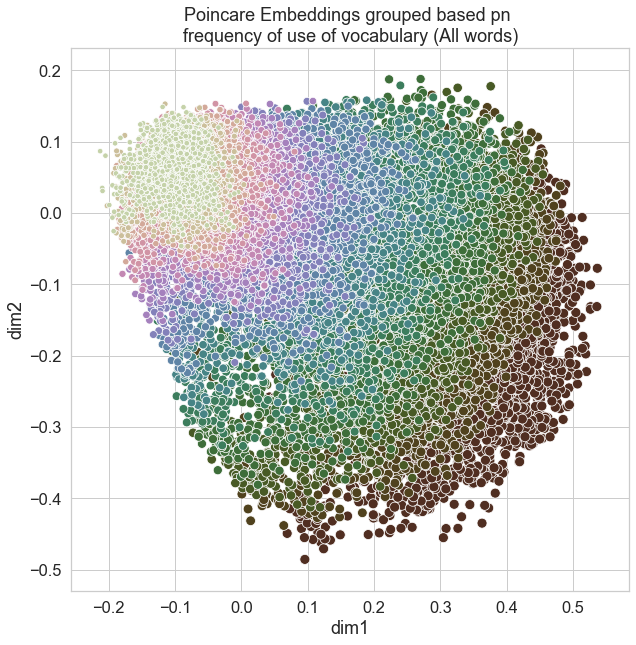

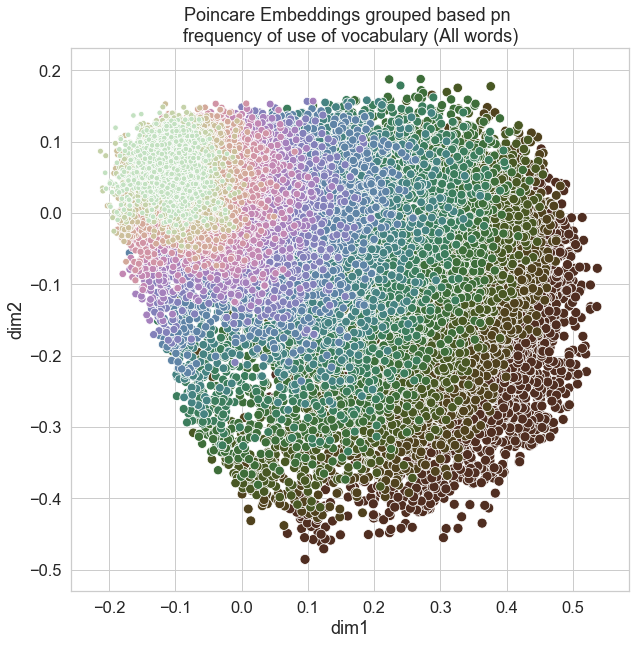

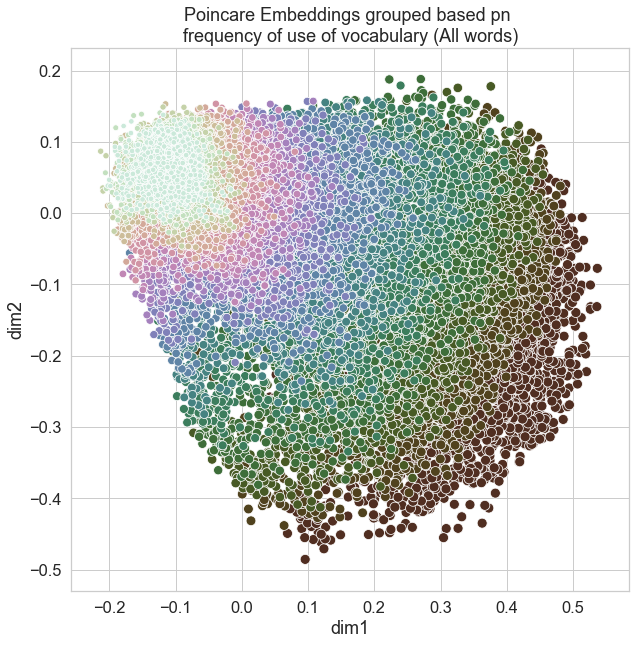

In [68]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
# cmap = sns.cubehelix_palette(rot=-.001, as_cmap=True)
starts = np.linspace(0.2,0.9,17)
for i in range(len(grouped_data)):
    f, ax = plt.subplots(figsize=(10, 10))
    plt.title("Poincare Embeddings grouped based pn \nfrequency of use of vocabulary (All words)")
    cmap = sns.cubehelix_palette(rot=2,start=0,gamma=.9,dark=starts[i], light=0.18, as_cmap=True)
    ax = sns.scatterplot(x="dim1", y="dim2",hue="importance", size="size",palette=cmap, sizes=(30, 100),data=grouped_data[i])
    handles, labels = ax.get_legend_handles_labels()
    ax.legend_.remove()
    plt.savefig("Embeds/wordembed{:02d}".format(i))
    plt.show()

In [70]:
import imageio
import glob
images = []
filenames = sorted(glob.glob("Embeds/*.png"))
for filename in filenames:
    images.append(imageio.imread(filename))
imageio.mimsave('Embeds/movie.gif', images,duration=0.15)

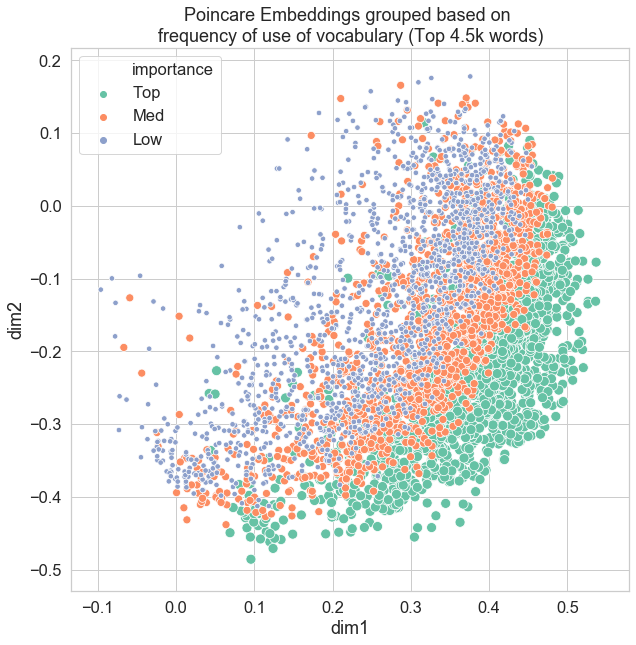

In [67]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
sns.set(font_scale=1.5)
sns.set_style("whitegrid")
f, ax = plt.subplots(figsize=(10, 10))
plt.title("Poincare Embeddings grouped based on \nfrequency of use of vocabulary (Top 4.5k words)")
cmap = sns.cubehelix_palette(dark=.3, light=.8,  as_cmap=True)
# cmap = sns.cubehelix_palette(gamma=.9,dark=.8, light=.18, as_cmap=True)
# cmap = sns.cubehelix_palette(rot=-.001, as_cmap=True)
ax = sns.scatterplot(x="dim1", y="dim2",hue="importance", size="size",palette="Set2", sizes=(30, 100),data=embed_data[:4500])
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles=handles[:4], labels=["importance","Top","Med","Low"])
plt.savefig("worddistributionsall_1500")

In [172]:
labels

['importance',
 '800',
 '1600',
 '2400',
 '3200',
 'size',
 '3.0',
 '4.5',
 '6.0',
 '7.5',
 '9.0']

In [48]:
handles

In [49]:
labels

['importance',
 'Top',
 'Med',
 'low',
 'rare',
 'super rare',
 'size',
 '0',
 '3',
 '6',
 '9']